<a href="https://colab.research.google.com/github/tobitprince/Fake-News/blob/main/Fake_News_detection_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re #work with regex
from wordcloud import WordCloud#text visualization python package
import pickle

In [2]:
from tensorflow.keras.preprocessing.text import Tokenizer#for tokenizing text data
from tensorflow.keras.preprocessing.sequence import pad_sequences#for padding dataset that are not long enough(for fixed length input)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Embedding,LSTM,Conv1D,MaxPool1D#layers
from sklearn.model_selection import train_test_split#splits dataset into train set and test set
from sklearn.metrics import classification_report,accuracy_score

Exploring the fake news dataset

In [3]:
fake = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')#reading the fake dataset

In [4]:
fake.head()#first few lines of the fake dataset

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [5]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [6]:
fake['subject'].value_counts()#getting to understand the different types of news articles

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

<Axes: xlabel='subject', ylabel='count'>

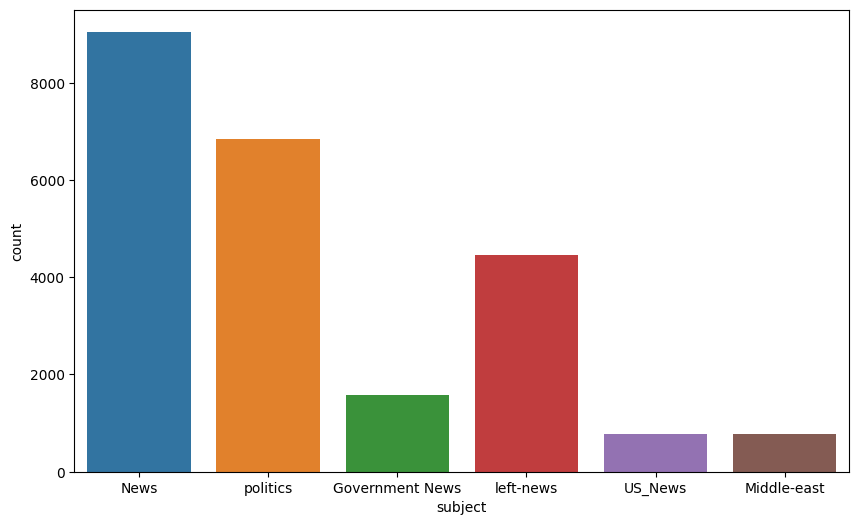

In [7]:
plt.figure(figsize=(10,6))
sns.countplot(x = 'subject',data=fake)#visualizing the different types of news articles

Wordcloud

In [8]:
text = ' '.join(fake['text'].tolist())#joining all the different texts into one, separated by white space

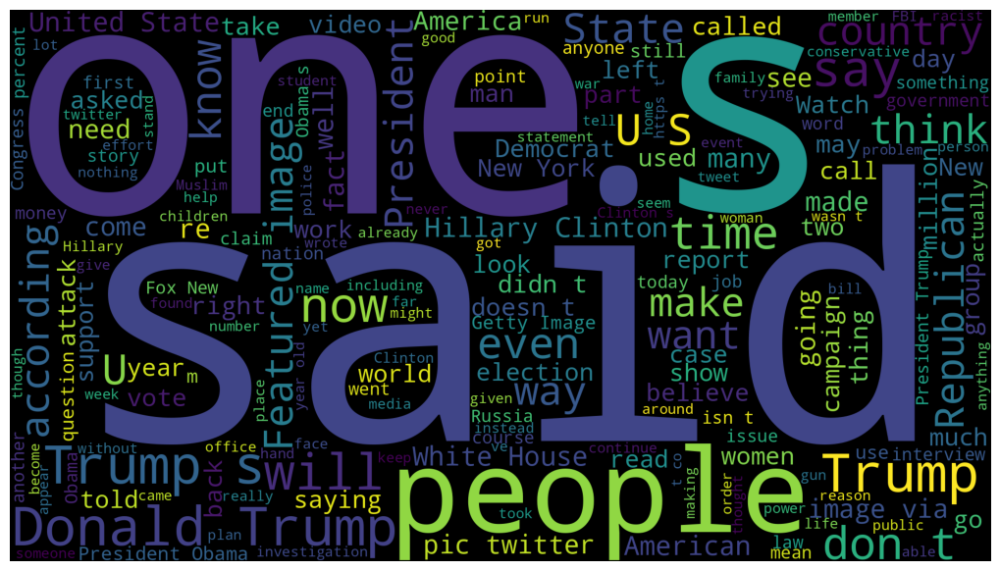

In [9]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)#generating the wordcloud
fig = plt.figure(figsize=(10,10))#changing the size of the wordcloud
plt.imshow(wordcloud)#show the wordcloud
plt.axis('off')#turning off the grid
plt.tight_layout(pad=0)
plt.show()

Exploring the real news dataset

In [10]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')#reading the real news dataset

In [11]:
text = ' '.join(real['text'].tolist())

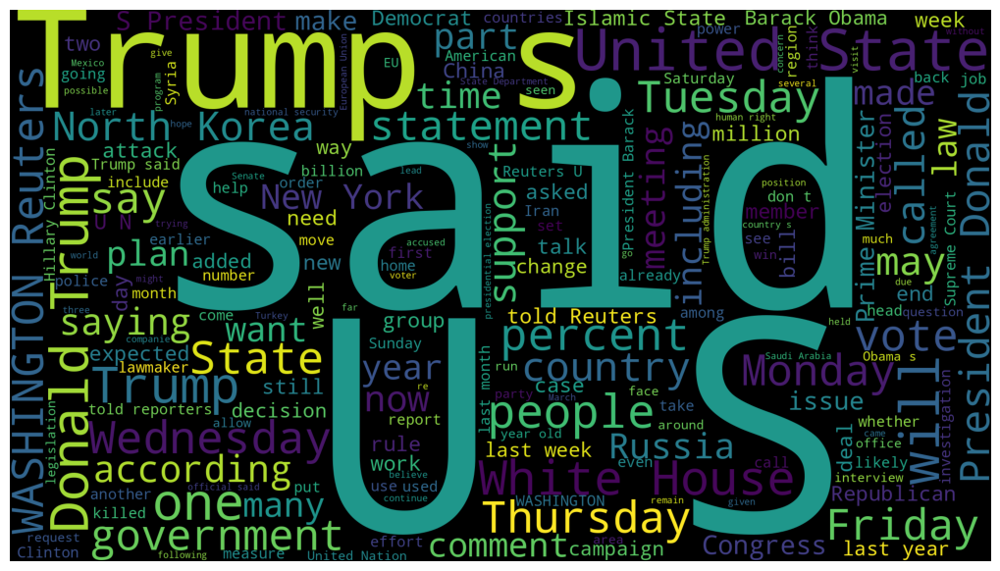

In [12]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Data Cleaning

In [13]:
unknown_publishers = []
for index,row in enumerate(real.text.values):
  try:
    record = row.split('-',maxsplit=1)# It is a number, which tells us to split the string into maximum of provided number of times
    record[1]
    assert(len(record[0])<120)#eliminates text that comes from Twitter
  except:
    unknown_publishers.append(index)

In [14]:
len(unknown_publishers)

222

In [15]:
real.iloc[unknown_publishers]

,title,text,subject,date
7,Factbox: Trump on Twitter (Dec 29) - Approval ...,The following statements were posted to the ve...,politicsNews,"December 29, 2017"
8,Trump on Twitter (Dec 28) - Global Warming,The following statements were posted to the ve...,politicsNews,"December 29, 2017"
12,Factbox: Trump on Twitter (Dec 28) - Vanity Fa...,The following statements were posted to the ve...,politicsNews,"December 28, 2017"
13,"Trump on Twitter (Dec 27) - Trump, Iraq, Syria",The following statements were posted to the ve...,politicsNews,"December 28, 2017"
14,Man says he delivered manure to Mnuchin to pro...,"(In Dec. 25 story, in second paragraph, corre...",politicsNews,"December 25, 2017"
...,...,...,...,...
20135,China's big money trumps U.S. influence in Cam...,(Story corrects to million from billion in pa...,worldnews,"September 11, 2017"
20500,UK publisher rejected request to block academi...,"(This Sept 8 story corrects headline, clarifi...",worldnews,"September 8, 2017"
20667,Rohingya say their village is lost to Myanmar'...,"(Story refiles to add dropped word not , in ...",worldnews,"September 7, 2017"
21246,'Gates of Hell': Iraqi army says fighting near...,(Story corrects third paragraph to show Mosul...,worldnews,"August 29, 2017"


In [16]:
real=real.drop(8970,axis=0)#the row is empty

In [17]:
publisher=[]
tmp_text=[]

for index,row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('Unknown')

  else:
    record=row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())

In [18]:
real['publisher']=publisher
real['text']=tmp_text

In [19]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [20]:
empty_fake_index = [index for index,text in enumerate(fake.text .tolist()) if str(text).strip==""]#instance in the fake dataset where the text field is empty

In [21]:
real['text']=real['title']+" "+real['text']#concatenate the text and title columns
fake['text']=fake['title']+" "+fake['text']

In [22]:
real['text']=real['text'].apply(lambda x: str(x).lower())#converting to lower case
fake['text']=fake['text'].apply(lambda x: str(x).lower())

Preprocessing text

In [23]:
#to facilitate supervised learning
real['class']=1
fake['class']=0

In [24]:
real=real[['text','class']]#only those two columns are of importance
fake=fake[['text','class']]

In [25]:
data=real.append(fake,ignore_index=True)#appending real and fake data

<ipython-input-25-2155e3589c01>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data=real.append(fake,ignore_index=True)#appending real and fake data


In [26]:
data


,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1
...,...,...
44892,mcpain: john mccain furious that iran treated ...,0
44893,justice? yahoo settles e-mail privacy class-ac...,0
44894,sunnistan: us and allied ‘safe zone’ plan to t...,0
44895,how to blow $700 million: al jazeera america f...,0


In [27]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall#for preprocessing, removing special characters

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 32.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
2024-01-03 17:32:01.864511: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-03 17:32:01.864576: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register fac

In [28]:
pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-t7i2zshx
  Running command git clone --filter=blob:none --quiet https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip-req-build-t7i2zshx
  Resolved https://github.com/laxmimerit/preprocess_kgptalkie.git to commit 96bf02872d9756f29d6cddb8aafaedcd2a39bbb4
  Preparing metadata (setup.py) ... done
  Created wheel for preprocess-kgptalkie: filename=preprocess_kgptalkie-0.1.3-py3-none-any.whl size=7602 sha256=99f5dc8f6721bf6a9b93c425996f92c217cd9bbd25fb2030e4aa2217d5f0ef86
  Stored in directory: /tmp/pip-ephem-wheel-cache-k6w6bxxq/wheels/5c/94/34/99d5ff65e88b8d9a6c5e8d8652f2311d87790a61a1b7466e21
Successfully built preprocess-kgptalkie


In [29]:
import preprocess_kgptalkie as ps


In [30]:
data['text']=data['text'].apply(lambda x: ps.remove_special_chars(x))#removing special characters

Vectorization(using word2vec)

In [31]:
import gensim

In [32]:
y=data['class'].values#the target

In [33]:
X=[d.split() for d in data['text'].tolist()]#every text item in the dataframe is converted into a list

In [34]:
X[2]

['senior',
 'us',
 'republican',
 'senator',
 'let',
 'mr',
 'mueller',
 'do',
 'his',
 'job',
 'the',
 'special',
 'counsel',
 'investigation',
 'of',
 'links',
 'between',
 'russia',
 'and',
 'president',
 'trumps',
 '2016',
 'election',
 'campaign',
 'should',
 'continue',
 'without',
 'interference',
 'in',
 '2018',
 'despite',
 'calls',
 'from',
 'some',
 'trump',
 'administration',
 'allies',
 'and',
 'republican',
 'lawmakers',
 'to',
 'shut',
 'it',
 'down',
 'a',
 'prominent',
 'republican',
 'senator',
 'said',
 'on',
 'sunday',
 'lindsey',
 'graham',
 'who',
 'serves',
 'on',
 'the',
 'senate',
 'armed',
 'forces',
 'and',
 'judiciary',
 'committees',
 'said',
 'department',
 'of',
 'justice',
 'special',
 'counsel',
 'robert',
 'mueller',
 'needs',
 'to',
 'carry',
 'on',
 'with',
 'his',
 'russia',
 'investigation',
 'without',
 'political',
 'interference',
 'this',
 'investigation',
 'will',
 'go',
 'forward',
 'it',
 'will',
 'be',
 'an',
 'investigation',
 'conducted',

In [35]:
DIM=100#each word is converted into a sequence of 100 vectors
w2v_model=gensim.models.Word2Vec(sentences=X,vector_size=DIM,window=10,min_count=1)

In [36]:
w2v_model.wv.most_similar('love')
#most_similar()->w2v_model.wv.most_similar('')

[('applaud', 0.708610475063324),
 ('appreciate', 0.7057390809059143),
 ('thank', 0.6969131827354431),
 ('wish', 0.6661361455917358),
 ('pray', 0.6648864150047302),
 ('admire', 0.6595972776412964),
 ('beautiful', 0.6580737829208374),
 ('loves', 0.6102325916290283),
 ('bless', 0.6001784801483154),
 ('wonderful', 0.5916252732276917)]

In [37]:
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)

In [38]:
X

[['as',
  'us',
  'budget',
  'fight',
  'looms',
  'republicans',
  'flip',
  'their',
  'fiscal',
  'script',
  'the',
  'head',
  'of',
  'a',
  'conservative',
  'republican',
  'faction',
  'in',
  'the',
  'us',
  'congress',
  'who',
  'voted',
  'this',
  'month',
  'for',
  'a',
  'huge',
  'expansion',
  'of',
  'the',
  'national',
  'debt',
  'to',
  'pay',
  'for',
  'tax',
  'cuts',
  'called',
  'himself',
  'a',
  'fiscal',
  'conservative',
  'on',
  'sunday',
  'and',
  'urged',
  'budget',
  'restraint',
  'in',
  '2018',
  'in',
  'keeping',
  'with',
  'a',
  'sharp',
  'pivot',
  'under',
  'way',
  'among',
  'republicans',
  'us',
  'representative',
  'mark',
  'meadows',
  'speaking',
  'on',
  'cbs',
  'face',
  'the',
  'nation',
  'drew',
  'a',
  'hard',
  'line',
  'on',
  'federal',
  'spending',
  'which',
  'lawmakers',
  'are',
  'bracing',
  'to',
  'do',
  'battle',
  'over',
  'in',
  'january',
  'when',
  'they',
  'return',
  'from',
  'the',
  

In [39]:
type(X)

list

In [40]:
X = tokenizer.texts_to_sequences(X)

In [41]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'said': 13,
 'trump': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'not': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'us': 30,
 'an': 31,
 'they': 32,
 'i': 33,
 'but': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'had': 41,
 'you': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'its': 55,
 'out': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'when': 60,
 'new': 61,
 'also': 62,
 'up': 63,
 'there': 64,
 'over': 65,
 'no': 66,
 'house': 67,
 'donald': 68,
 'our': 69,
 'states': 70,
 'clinton': 71,
 'obama': 72,
 'government': 73,
 'can': 74,
 'just': 75,
 'him': 76,
 'so': 77,
 'than': 78,
 'republican': 79,
 'other': 80,
 'so

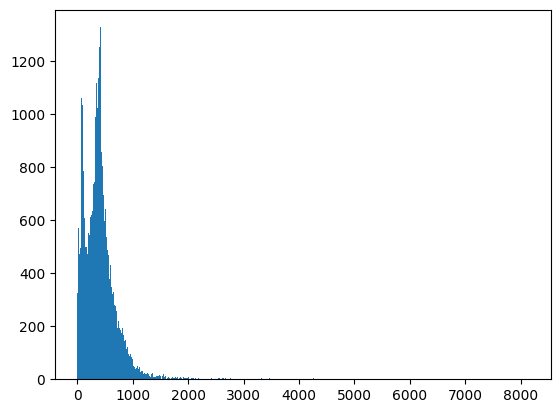

In [42]:
plt.hist([len(x) for x in X],bins=700)#plot a histogram->total number of words in each news item
plt.show()

In [43]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])#getting the number of news items which have more than 1000 words(majority have less)

1581

In [44]:
maxlen=1000
X=pad_sequences(X,maxlen=maxlen)#if <1000 padded, if>1000 truncated

In [45]:
len(X[20])

1000

In [46]:
vocab_size = len(tokenizer.word_index)+1#to cater for unknown words
vocab = tokenizer.word_index

In [47]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size,DIM))

  for word,i in vocab.items():
    weight_matrix[i]=model.wv[word]
  return weight_matrix


In [48]:
embedding_vectors = get_weight_matrix(w2v_model)

In [49]:
model = Sequential()
model.add(Embedding(vocab_size,output_dim=DIM, weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [50]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23187300  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23304677 (88.90 MB)
Trainable params: 117377 (458.50 KB)
Non-trainable params: 23187300 (88.45 MB)
_________________________________________________________________


In [51]:
X_train,X_test,y_train,y_test=train_test_split(X,y)#splitting into train and test data

In [52]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 [==============================] - 38s 46ms/step - loss: 0.1526 - acc: 0.9443 - val_loss: 0.1025 - val_acc: 0.9670
Epoch 2/6
737/737 [==============================] - 33s 45ms/step - loss: 0.1096 - acc: 0.9620 - val_loss: 0.0593 - val_acc: 0.9805
Epoch 3/6
737/737 [==============================] - 33s 45ms/step - loss: 0.0404 - acc: 0.9870 - val_loss: 0.0273 - val_acc: 0.9916
Epoch 4/6
737/737 [==============================] - 33s 45ms/step - loss: 0.0190 - acc: 0.9936 - val_loss: 0.0221 - val_acc: 0.9926
Epoch 5/6
737/737 [==============================] - 33s 45ms/step - loss: 0.0104 - acc: 0.9967 - val_loss: 0.0189 - val_acc: 0.9939
Epoch 6/6
737/737 [==============================] - 33s 45ms/step - loss: 0.0120 - acc: 0.9967 - val_loss: 0.0174 - val_acc: 0.9943


In [53]:
y_pred = (model.predict(X_test)>=0.5).astype(int)

351/351 [==============================] - 6s 15ms/step


In [54]:
accuracy_score(y_test,y_pred)

0.9942984409799555

In [55]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      5819
           1       0.99      0.99      0.99      5406

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [56]:
pickle.dump(model,open('model.pkl','wb'))

In [57]:
!pip install flask_ngrok

In [58]:
!curl -s https://ngrok-agent.s3.amazonaws.com/ngrok.asc | sudo tee /etc/apt/trusted.gpg.d/ngrok.asc >/dev/null && echo "deb https://ngrok-agent.s3.amazonaws.com buster main" | sudo tee /etc/apt/sources.list.d/ngrok.list && sudo apt update && sudo apt install ngrok

deb https://ngrok-agent.s3.amazonaws.com buster main
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [643 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 https://ngrok-agent.s3.amazonaws.com buster InRelease [20.3 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:8 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 https://ngrok-agent.s3.amazonaws.com buster/main amd64 Packages [3,407 B]
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jam

In [59]:
!ngrok authtoken 1j6eNAjyuuHUNm57yAIdG1nMKuW_P27Lrx6H7EZoMiPXDBHm

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [60]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential

In [61]:
import flask
from flask import Flask, render_template, request
import pickle
import numpy as np
from flask_ngrok import run_with_ngrok
import warnings
import sqlite3
warnings.filterwarnings('ignore')



app = Flask(__name__)
run_with_ngrok(app)

model = pickle.load(open('model.pkl', 'rb'))

@app.route('/', methods=['GET'])
def home():
  return render_template('project_main.html')

@app.route('/', methods=['GET', "POST"])
def run_model():
  data=request.form['a']
  x=[data]
  x=tokenizer.texts_to_sequences(x)
  x=pad_sequences(x,maxlen=maxlen)
  y_pred=(model.predict(x))*100

  return "The article provided is"+str(y_pred)+"percent accurate"
  #(model.predict(x)>=0.5).astype(int)
  #model.predict(x)

  #idea,write the application logic on same ipynb file as the model itself

@app.route('/feedback')
def feedback():
  return render_template('feedback.html')

@app.route('/insert',methods=['post'])
def insert():
  try:
    feedback = request.form['feedback']
    with sqlite3.connect("user_feedback.db") as conn:
        cur = conn.cursor()
        cur.execute("insert into feedback (user_feedback) values(?)", [feedback])
        conn.commit()
  except:
    conn = sqlite3.connect("user_feedback.db")
    conn.execute('create table feedback(feedback_id INTEGER PRIMARY KEY,user_feedback text)')
    feedback = request.form['feedback']
    with sqlite3.connect("user_feedback.db") as conn:
        cur = conn.cursor()
        cur.execute("insert into feedback (user_feedback) values(?)", [feedback])
        conn.commit()

  return render_template('feedback.html')

@app.route('/select')
def select_all_records():
    with sqlite3.connect("user_feedback.db") as conn:
        conn.row_factory = sqlite3.Row
        cur = conn.cursor()
        cur.execute("select * from feedback")
        rows = cur.fetchall()
    return render_template("content.html", rows_content=rows)



app.run()

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
Exception in thread Thread-31:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/urllib3/connection.py", line 203, in _new_conn
    sock = connection.create_connection(
  File "/usr/local/lib/python3.10/dist-packages/urllib3/util/connection.py", line 85, in create_connection
    raise err
  File "/usr/local/lib/python3.10/dist-packages/urllib3/util/connection.py", line 73, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/urllib3/connectionpool.py", line 791, in urlopen
    response = self._make_request(
  File "/usr/local/lib/python3.10/dist-packages/urll